# King County Housing EDA and Inferences

## Overview

In this notebook I conduct data analysis on King County Housing data for the purpose of making predictions via Linear Regression. In addition to familiarizing myself with potential modeling problems, I also create features in an attempt to better represent housing prices in my model.

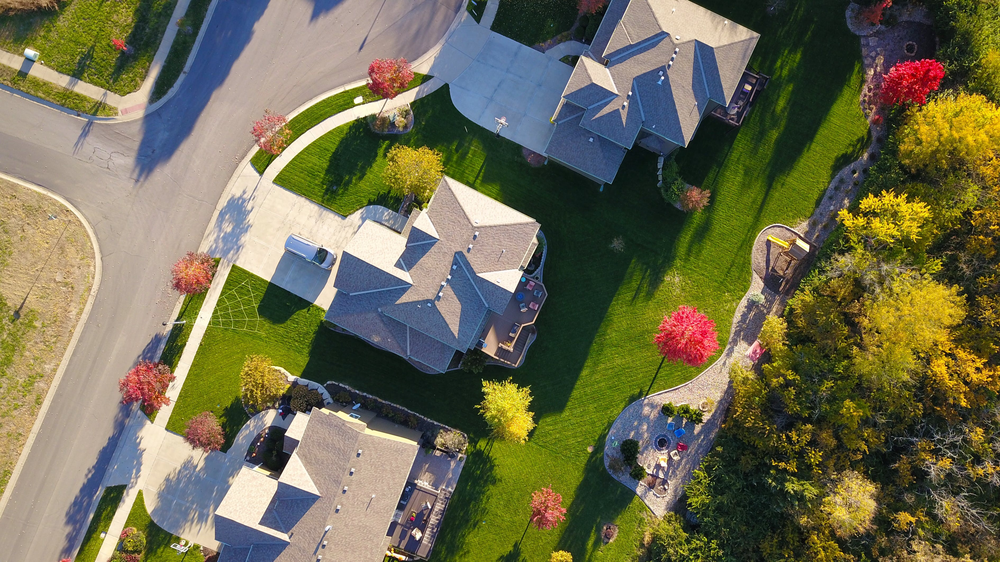

<center>
    Image by
    <a href = https://www.pexels.com/@davidmcbee>David McBee</a>
    from
    <a href = https://www.pexels.com>Pexels</a>
</center>

## Data Structure

All data csv's can be found in the /data folder.
- kc_house_data_test_features and kc_data_train obtained via Flatiron School
- All csv's prefixed with "king_county_" obtained from [PolicyMap](https://www.policymap.com)

All visualizations can be found in the /images folder.

## Primary Focus

My primary focus for this data analysis is three-fold:
1. Identify extreme values that may cause problems within my model.
2. Identify variables with very low value counts that may benefit from grouping into ranges
3. Engineer new features that might better represent homes that fall outside the average range

___

# <center> Data Analysis </center>

___

### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
from scipy import stats
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
import folium
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.feature_selection import RFECV
import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', 100)

### Reading in Initial Housing Data

In [2]:
df = pd.read_csv('../data/kc_house_data_train.csv', index_col = 0)

# Removing the time variable from date
df['date'] = df['date'].map(lambda x: x[:8])

# Altering the cleaned date into datetime type
df['date'] = pd.to_datetime(df['date'])

# Create a copy for alterations for retention of original data
df_clean = df.copy()

### Reading in PolicyMaps Census Data

In [3]:
#Create a filepath to the folder containing king_county data
files = Path('../data/').rglob('king_county*.csv')

#Create a list with all csv information
    #Set zip codes as index for later concatenation
    #Alter csv's NaN values from '0' to NaN
all_csvs = [pd.read_csv(file,
                        index_col = 'Zip Code Tabulation Area',
                        usecols = [0,3],
                        na_values = 0,
                        skipfooter = 11
                        )\
            for file in files]

#Concatenate all csv's using zip code as index
#Remove zip code as index and rename columns
king_county_df = pd.concat(all_csvs, axis = 1).reset_index()\
.rename(columns = {'Zip Code Tabulation Area': 'zipcode',
                    'Estimated number of housing units, between 2015-2019.': 'number_of_housing_units',
                    'Estimated median value of an owner-occupied home, between 2015-2': 'median_value_occupied_home',
                    'Estimated median income of a household, between 2015-2019.': 'household_median_income',
                    'Estimated number of people per square mile, between 2015-2019.': 'people_per_square_mile',
                    'Estimated percent of all people that are living in poverty as of': 'poverty_rate'})

#Drop zip codes not within housing data
king_county_df.drop(king_county_df[king_county_df['zipcode'].isin(list(df_clean['zipcode'])) != True].index,
                    inplace = True)
king_county_df.reset_index(drop = True, inplace = True)

#Attach to main dataframe
df_clean = df_clean.merge(king_county_df, how = 'left', on = 'zipcode')

In [4]:
df_clean.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,number_of_housing_units,median_value_occupied_home,household_median_income,people_per_square_mile,poverty_rate
0,2591820310,2014-10-06,365000.0,4,2.25,2070,8893,2.0,0,0,4,8,2070,0,1986,0,98058,47.4388,-122.162,2390,7700,16522.0,403100.0,92225.0,2310.77,6.78
1,7974200820,2014-08-21,865000.0,5,3.00,2900,6730,1.0,0,0,5,8,1830,1070,1977,0,98115,47.6784,-122.285,2370,6283,23641.0,751900.0,111569.0,8212.94,8.48
2,7701450110,2014-08-15,1038000.0,4,2.50,3770,10893,2.0,0,2,3,11,3770,0,1997,0,98006,47.5646,-122.129,3710,9685,14262.0,863000.0,144247.0,3536.54,4.71
3,9522300010,2015-03-31,1490000.0,3,3.50,4560,14608,2.0,0,2,3,12,4560,0,1990,0,98034,47.6995,-122.228,4050,14226,18469.0,557600.0,101674.0,4796.36,7.13
4,9510861140,2014-07-14,711000.0,3,2.50,2550,5376,2.0,0,0,3,9,2550,0,2004,0,98052,47.6647,-122.083,2250,4050,29639.0,725300.0,135287.0,3492.93,5.12


### Column Information

* **id** - unique ID for a house
* **date** - Date house was sold
* **price** - Price is prediction target
* **bedrooms** - Number of bedrooms
* **bathrooms** - Number of bathrooms
* **sqft_living** - square footage of the home
* **sqft_lot** - square footage of the lot
* **floors** - Total floors (levels) in house
* **waterfront** - Whether house has a view to a waterfront
* **view** - The quality of the view
* **condition** - How good the condition is (overall)
* **grade** - overall construction grade given to the housing unit, based on King County grading system
* **sqft_above** - square footage of house (apart from basement)
* **sqft_basement** - square footage of the basement
* **yr_built** - Year when house was built
* **yr_renovated** - Year when house was renovated
* **zipcode** - zip code in which house is located
* **lat** - Latitude coordinate
* **long** - Longitude coordinate
* **sqft_living15** - The square footage of interior housing living space for the nearest 15 neighbors
* **sqft_lot15** - The square footage of the land lots of the nearest 15 neighbors

___

After viewing the initial data, I began my data analysis with the few that had the highest correlation with price.

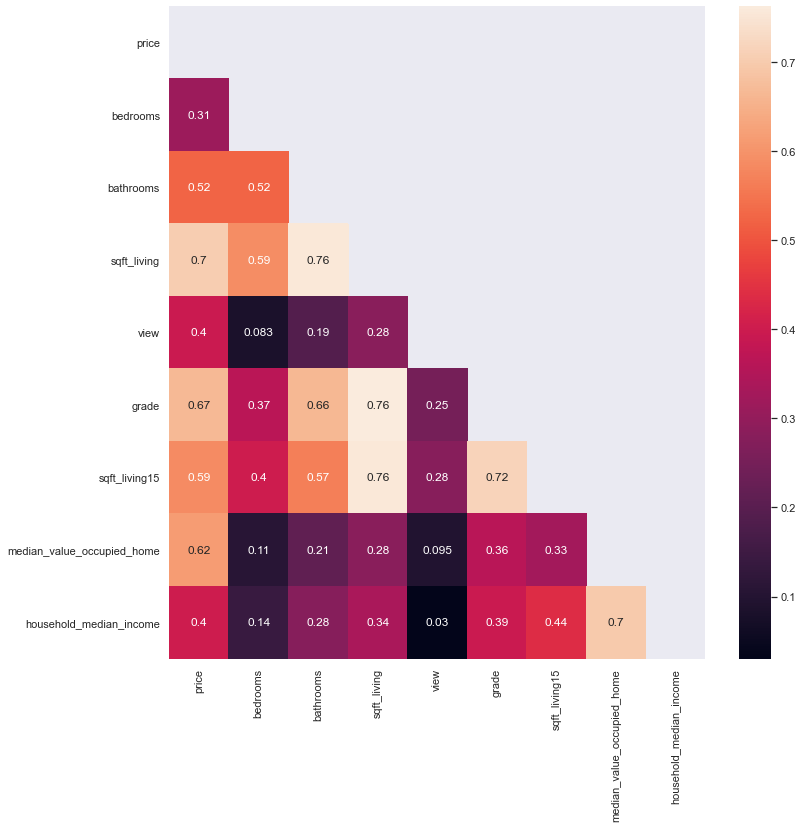

In [18]:
sns.set(rc={'figure.figsize':(12, 12)})
#Values that had a correlation higher than .3 in relation to price
corr = df_clean[['price','bedrooms','bathrooms','sqft_living','view', 'grade',
                 'sqft_living15', 'median_value_occupied_home', 'household_median_income']].corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(corr, mask = mask, annot = True);

I began by looking into bedrooms and immediately detected an irregularity. A quick plot showing the number of bedrooms per house shows that one value in particular sticks out.

Text(0.5, 1.0, 'Bedrooms per House')

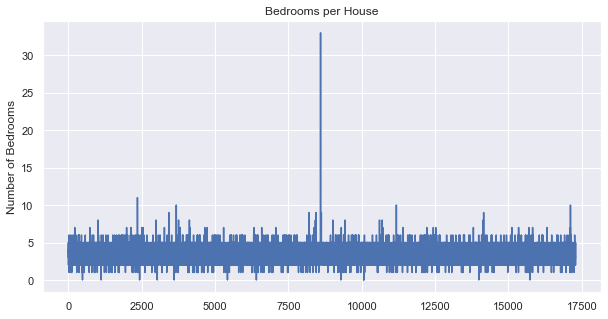

In [37]:
fig, ax = plt.subplots(figsize = (10,5))

ax.plot(df['bedrooms'])
ax.set_ylabel('Number of Bedrooms')
ax.set_title('Bedrooms per House')

___

From viewing the bedroom count alone this creates some questions as to its origins. As such, I took a look at its values

In [22]:
df_clean[df_clean['bedrooms'] > 30]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,number_of_housing_units,median_value_occupied_home,household_median_income,people_per_square_mile,poverty_rate
8597,2402100895,2014-06-25,640000.0,33,1.75,1620,6000,1.0,0,0,5,7,1040,580,1947,0,98103,47.6878,-122.331,1330,4700,26419.0,739100.0,105177.0,11469.06,6.66


At an initial glance, there is no particular aspect that stands out as far as explaining the bedrooms count. In fact items such as: sqft_living, sqft_lot, and floors discount the idea of it being a hotel or apartment. However, a quick plug of the latitude and longitude show us the house's location.

___

In [30]:
bedroom_map = folium.Map(location = [47.6878, -122.331], tiles = 'OpenStreetMap', zoom_start = 16)

folium.Marker(location = [47.6878, -122.331]).add_to(bedroom_map)
bedroom_map

A quick investigation shows that the house resides in a residential neighborhood void of large structures in its immediate vicinity. As an additional check, I placed the coordinates into [GoogleMaps](https://www.google.com/maps/place/47%C2%B041'16.1%22N+122%C2%B019'51.6%22W/@47.6878056,-122.3331887,1070m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x0!8m2!3d47.6878056!4d-122.331) to ensure my assumption was correct

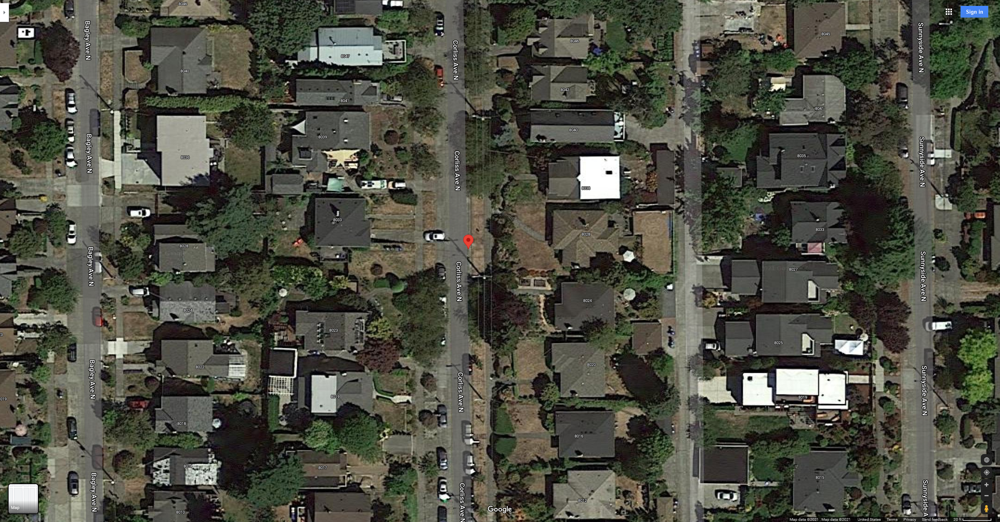

It would appear that the houses in this area would be incapable of supporting thirty-three average sized bedrooms, or smaller than average for that matter. As such, I believe it is safe to make the assumption that thirty-three was likely made in error. It was potentially intended to be three and the number was unintentionally duplicated. However, to avoid creating too many assumptions, I instead utilized the following parameter to rectify this issue.

In [4]:
#Conditional set to 16, the 2nd largest value + 5 standard deviations
df_clean['bedrooms'] = np.where(df_clean['bedrooms'] > 16,
                                #Average bedrooms rounded to the nearest whole number
                                round(df_clean['bedrooms'].mean(), 0)
                                , df_clean['bedrooms'])

In [34]:
#Searching the value's index shows "bedrooms" now equal to "3"
df_clean.iloc[8597]['bedrooms']

3.0

___

#  <center> Binning </center>

___

<p>
<p>Following this, I investigated the grades column and found a suprising disparity in values.
<p>

Text(0.5, 1.0, 'Number of Grades')

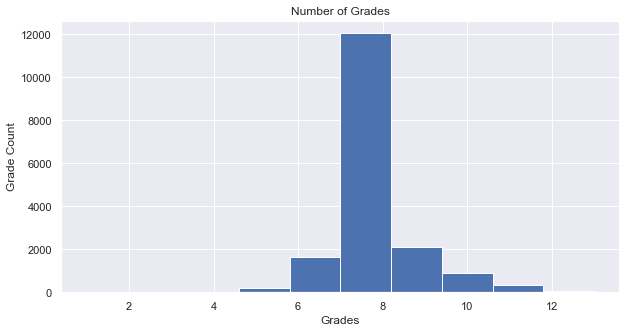

In [39]:
fig, ax = plt.subplots(figsize = (10,5))

plt.hist(df_clean['grade'])
ax.set_ylabel('Grade Count')
ax.set_xlabel('Grades')
ax.set_title('Number of Grades')

A quick look found that 1-3 is below construction standards, 7 is average, and 11-13 is exceptional.

I took a look at the price disparity of the grades to get a better idea of how to bin these values, in order to account for the value count disparity.

<AxesSubplot:xlabel='grade', ylabel='price'>

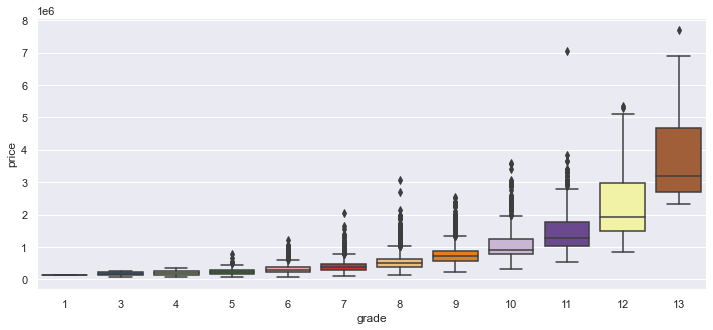

In [44]:
sns.set(rc={'figure.figsize':(12, 5)})
sns.set_palette('Paired')
sns.boxplot(x = df_clean['grade'],
                y = df_clean['price'],)

As a compromise between: the grading's system, price disparity between them, as well as value counts; the following bins were selected for the data.

In [5]:
# All values below 7
df_clean['below_average_grade'] = np.where(df_clean['grade'] < 7, 1, 0)
# All average values, 7
df_clean['average_grade'] = np.where(df_clean['grade'] == 7, 1, 0)
# All values between 8 and 10
df_clean['above_average_grade'] = np.where(df_clean['grade'].isin(range(8,11)), 1, 0)
# All values 11 and up
df_clean['high_grade'] = np.where(df_clean['grade'] > 10, 1, 0)

<p>
<p>To double-check the statistical significance of this split, I ran an ANOVA test on each bin and found a p-value of 0, showing an extremely low chance that the price ranges in these bins are identical.
<p>

In [42]:
grades_group = {'low': df_clean[df_clean['below_average_grade'] == 1]['price'],
                'average': df_clean[df_clean['average_grade'] == 1]['price'],
                'above_average_grade': df_clean[df_clean['above_average_grade'] == 1]['price'],
                'high': df_clean[df_clean['high_grade'] == 1]['price']
               }
stats.f_oneway(*grades_group.values())

F_onewayResult(statistic=3626.7959401332328, pvalue=0.0)

<p>
<p>I underwent an identical process in order to bin the bathroom values, viewing the same elements in order to come a conclusion regarding which values to group together.
<p>

<AxesSubplot:xlabel='bathrooms', ylabel='price'>

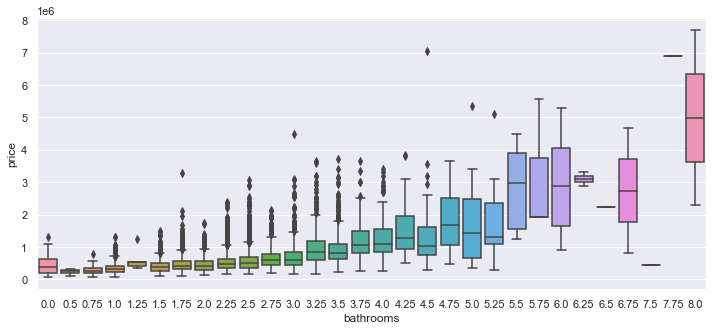

In [45]:
sns.set(rc={'figure.figsize':(12, 5)})
sns.set_palette('Paired')
sns.boxplot(x = df_clean['bathrooms'],
                y = df_clean['price'],)

In [6]:
df_clean['bath_5_plus'] = np.where(df_clean['bathrooms'] >= 5.5, 1, 0)
df_clean['bath_3_5'] = np.where((df_clean['bathrooms'] >= 3.75) & (df_clean['bathrooms'] < 5.5), 1, 0)
df_clean['bath_2_3'] = np.where((df_clean['bathrooms'] >= 2.75) & (df_clean['bathrooms'] < 3.75), 1, 0)
df_clean['bath_1_2'] = np.where((df_clean['bathrooms'] >= 1.25) & (df_clean['bathrooms'] < 2.75), 1, 0)
df_clean['bath_1_minus'] = np.where(df_clean['bathrooms'] < 1.25, 1, 0)

<p>
<p>Running an ANOVA test on these variables shows a similarly low p-value.
<p>

In [47]:
bath_group = {'bath_5_plus': df_clean[df_clean['bath_5_plus'] == 1]['price'],
              'bath_3_5': df_clean[df_clean['bath_3_5'] == 1]['price'],
              'bath_2_3': df_clean[df_clean['bath_2_3'] == 1]['price'],
              'bath_1_2': df_clean[df_clean['bath_1_2'] == 1]['price'],
              'bath_1_minus': df_clean[df_clean['bath_1_minus'] == 1]['price']
             }
stats.f_oneway(*bath_group.values())

F_onewayResult(statistic=1937.1921478765958, pvalue=0.0)

___

# <center> Feature Interaction </center>

___

Two values in particular caught my eye within the correlation matrix. Those being sqft_living as well as median_value_occupied_home due to their high correlation with price.

Here, I interact the variables to view whether interacting them creates a higher correlation with price as logically, an interaction between the square footage of living space should correlate with a house's price.

In [7]:
#Create a new column for the interaction
df_clean['sqft_x_median_value'] = df_clean['sqft_living'] * df_clean['median_value_occupied_home']

#Test the interaction's correlation with price against their independent correlations with price
sqft_x_median_value_corr = df_clean.corr()['price']['sqft_x_median_value']
sqft_corr = df_clean.corr()['price']['sqft_living']
median_value_corr = df_clean.corr()['price']['median_value_occupied_home']

print(f'The square footage\'s correlation with price is: {sqft_corr}')
print(f'The median value of an occupied home\'s correlation with price is: {median_value_corr}')
print(f'Finally, the interaction\'s correlation with price is: {sqft_x_median_value_corr}')

The square footage's correlation with price is: 0.7035403039789652
The median value of an occupied home's correlation with price is: 0.6152845875784752
Finally, the interaction's correlation with price is: 0.8497748281389159


<p>
<p>Here, it can be seen that their independent correlations with price are quite high. However, their interaction produces a higher correlation.

<p>An additional interaction I created was between the number of floors a home had as well as the quality of its view.
<p>

In [8]:
#Create a new column for the interaction
df_clean['floors_x_view'] = df_clean['floors'] * df_clean['view']

#Test the interaction's correlation with price against their independent correlations with price
floors_x_view = df_clean.corr()['price']['floors_x_view']
floors_corr = df_clean.corr()['price']['floors']
view_corr = df_clean.corr()['price']['view']

print(f'The number of floor\'s correlation with price is: {floors_corr}')
print(f'The quality of view\'s correlation with price is: {view_corr}')
print(f'Finally, the interaction\'s correlation with price is: {floors_x_view}')

The number of floor's correlation with price is: 0.25698507185137487
The quality of view's correlation with price is: 0.3954851030219499
Finally, the interaction's correlation with price is: 0.42409328480627645


<p>
<p>Independently, their correlations are relatively low. However, once interacted, their correlation increases by a reasonable sum.
<p>

___

# <center> Accounting for High Value Homes </center>

___

One of the items that threw off my initial model, was a much higher heteroskedasticity than showed by the final model. In order account for this, I plotted them against a map to view their locations.

In [83]:
#Initialize a map on a central location
high_value_homes_map = folium.Map(location = [47.615471, -122.205341], tiles = 'OpenStreetMap', zoom_start = 11)

#Create a list of tuples containing the latitude and longitudes of the homes
high_value_homes = list(zip(df_clean[df_clean['price'] > 2000000]['lat'],
                            df_clean[df_clean['price'] > 2000000]['long']))

#Add a marker for each tuple
for coord in high_value_homes:
    folium.Marker(location = coord).add_to(high_value_homes_map)

high_value_homes_map

Something that immediately pops out is their vicinity to water, as such I plotted additional points to try and capture a portion of these homes, utilizing the waterfront category as a primary marker.

In [85]:
#Initialize a map on a central location
waterfront_wealth_map = folium.Map(location = [47.615471, -122.205341], tiles = 'OpenStreetMap', zoom_start = 11)

#Create a list of tuples containing the latitude and longitudes of the homes
waterfront_wealth_coord = list(zip(df_clean[(df_clean['waterfront'] == 1) &
                                            #Utilize longitude/latitude to pull data for the area
                                            (df_clean['long'] > -122.4) &
                                            (df_clean['lat'] > 47.5)]['lat'],
                                   df_clean[(df_clean['waterfront'] == 1) &
                                            (df_clean['long'] > -122.4) &
                                            (df_clean['lat'] > 47.5)]['long']))

#Add a marker for each tuple
for coord in waterfront_wealth_coord:
    folium.Marker(location = coord).add_to(waterfront_wealth_map)

waterfront_wealth_map

<p>
<p>Comparing these two maps, I can see that a good portion of the waterfront properties listed as above a $2 million price have been captured. As such, I create a variable to contain these.
<p>

In [9]:
#Create a dummy variable to mark homes with the following conditions
df_clean['waterfront_wealth'] = np.where((df_clean['waterfront'] == 1) &
                                         (df_clean['long'] > -122.4) &
                                         (df_clean['lat'] > 47.5),
                                         1, 0)

<p>
<p>I also check its correlation with price as well as run a T-test between houses marked as waterfront_wealth and houses not marked so.
<p>

In [75]:
waterfront_corr = df_clean.corr()['price']['waterfront']
waterfront_wealth_corr = df_clean.corr()['price']['waterfront_wealth']
waterfront_wealth_ttest = stats.ttest_ind(df_clean[df_clean['waterfront_wealth'] == 1]['price'],
                                          df_clean[df_clean['waterfront_wealth'] == 0]['price'])

print(f'Waterfront\'s correlation alone with price is: {waterfront_corr}')
print(f'Waterfront_wealth\'s correlation with price is: {waterfront_wealth_corr}')
print(f'The p-value of the T-test is: {waterfront_wealth_ttest[1]}')

Waterfront's correlation alone with price is: 0.2757786708046838
Waterfront_wealth's correlation with price is: 0.30874083097483923
The p-value of the T-test is: 0.0


By partitioning the waterfront properties, it shows a slight increase in correlation with price. The low p-value as well shows that the price values between those marked and those not marked are likely not identical.

___

# Linear Regression Model

___

Having investigated various aspects, as well as undergoing a process of feature engineering, I now place them into a Linear Regression Model to view if the new features show a change in R-squared.

In [80]:
mlr_model = ols(formula = 'price ~ sqft_living+median_value_occupied_home+grade+\
                        view+floors+bathrooms+waterfront', 
                data = df_clean).fit()
mlr_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.750
Model:                            OLS   Adj. R-squared:                  0.750
Method:                 Least Squares   F-statistic:                     7422.
Date:                Fri, 04 Jun 2021   Prob (F-statistic):               0.00
Time:                        00:42:48   Log-Likelihood:            -2.3437e+05
No. Observations:               17290   AIC:                         4.688e+05
Df Residuals:                   17282   BIC:                         4.688e+05
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                  -6.337e+05   1.12e+04    -56.761      0.000   -6.56e+05   -6.12e+05
sqft_living                  174.2407      2.850     61.141      0.000     168.655     179.827
median_value_occupied_home     0.7416      0.007    104.538      0.000       0.728       0.755
grade                         5.1e+04   2042.392     24.969      0.000     4.7e+04     5.5e+04
view                        6.501e+04   2092.229     31.074      0.000    6.09e+04    6.91e+04
floors                     -1.919e+04   3157.007     -6.078      0.000   -2.54e+04    -1.3e+04
bathrooms                  -9272.6787   3048.938     -3.041      0.002   -1.52e+04   -3296.452
waterfront                  6.412e+05   1.75e+04     36.699      0.000    6.07e+05    6.75e+05
==============================================================================
Omnibus:                    17740.001   Durbin-Watson:                   2.013
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          3686615.309
Skew:                           4.656   Prob(JB):                         0.00
Kurtosis:                      73.927   Cond. No.                     7.92e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.92e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<p><p>
<p>The first model shows promising results, utilizing only the base values that I used to engineer features.
<p>However, the second model below shows better results when utilizing the engineered features.
<p><p>

In [78]:
mlr_model = ols(formula = 'price ~ sqft_x_median_value+above_average_grade+\
                        high_grade+floors_x_view+bath_5_plus+bath_2_3+\
                        bath_1_2+bath_1_minus+waterfront_wealth', 
                data = df_clean).fit()
mlr_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.799
Model:                            OLS   Adj. R-squared:                  0.799
Method:                 Least Squares   F-statistic:                     7634.
Date:                Fri, 04 Jun 2021   Prob (F-statistic):               0.00
Time:                        00:41:55   Log-Likelihood:            -2.3250e+05
No. Observations:               17290   AIC:                         4.650e+05
Df Residuals:                   17280   BIC:                         4.651e+05
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept            1.873e+05   1.01e+04     18.613      0.000    1.68e+05    2.07e+05
sqft_x_median_value     0.0003   1.87e-06    148.459      0.000       0.000       0.000
above_average_grade   4.26e+04   3113.672     13.681      0.000    3.65e+04    4.87e+04
high_grade           2.699e+05   1.05e+04     25.814      0.000    2.49e+05     2.9e+05
floors_x_view        4.076e+04   1103.149     36.950      0.000    3.86e+04    4.29e+04
bath_5_plus          3.026e+05   3.54e+04      8.551      0.000    2.33e+05    3.72e+05
bath_2_3            -5.863e+04   9264.806     -6.328      0.000   -7.68e+04   -4.05e+04
bath_1_2            -6.744e+04   9273.743     -7.272      0.000   -8.56e+04   -4.93e+04
bath_1_minus        -3.191e+04      1e+04     -3.185      0.001   -5.16e+04   -1.23e+04
waterfront_wealth    8.402e+05   1.92e+04     43.778      0.000    8.03e+05    8.78e+05
==============================================================================
Omnibus:                    11881.673   Durbin-Watson:                   2.037
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1181692.393
Skew:                           2.498   Prob(JB):                         0.00
Kurtosis:                      43.191   Cond. No.                     4.54e+10
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.54e+10. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

___

# <center> Testing the Model </center>

___

After the data analysis, I split the data into a test/train split to see how well it performs against unseen data.

In [ ]:
#Dummy the zipcodes
df_clean = df_clean.merge((pd.get_dummies(df_clean['zipcode'], drop_first = True)),
                          how = 'left', left_index = True, right_index = True)

#Split the data into dependent/independent variables
y = df_clean[['price']]

#Drop variables not needed with dependent variables
X = df_clean.drop(['price', 'date', 'id', 'zipcode'], axis = 1)

#Split the data into a training and testing split
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    #Utilize a 80/20 split
                                                    test_size=0.2,
                                                    #Set a seed to compare RMSE changes
                                                    random_state=30)

In [22]:
#Utilize KBest to find the best variables to include in the model
selector = SelectKBest(f_regression, k='all')
selector.fit(X_train, y_train)

#Assign a list of returned columns to a variable
selected_columns = X_train.columns[selector.get_support()]

#Utilize RFECV to select the best variables to utilize from those selected by KBest
selector_RFECV = RFECV(estimator=LinearRegression(), step=1, cv=7, scoring='neg_mean_squared_error', n_jobs=-1, verbose=1)
selector_RFECV.fit(X_train[selected_columns], y_train)

#Assign a list of the return columns to a variable
selected_rfe = X_train[selected_columns].columns[selector_RFECV.support_]

In [23]:
#Initialize a Linear Regression model that utilizes the RFECV's selected columns
lr = linear_model.LinearRegression()
lr.fit(X_train[selected_rfe], y_train)
test_pred = lr.predict(X_test[selected_rfe])
train_pred = lr.predict(X_train[selected_rfe])

#Retrieve the RMSE of the training/testing predictions
res_train = np.sqrt(mean_squared_error(y_train, train_pred))
res_test =  np.sqrt(mean_squared_error(y_test, test_pred))

#Create a percent error between the training and testing RMSE
percent_error = round(abs((res_train - res_test)/((res_train + res_test)/2)) *100, 2)

print(f'The training set RMSE is: {res_train}.')
print(f'The testing set RMSE is: {res_test}.')
print(f'The percent error between them is: {percent_error}.')

The training set RMSE is: 140121.82901049175.
The testing set RMSE is: 134526.5124724562.
The percent error between them is: 4.07.


The resulting model has produced a result that is not bad. However, I did want to check how the residuals appear.

<AxesSubplot:xlabel='price', ylabel='price'>

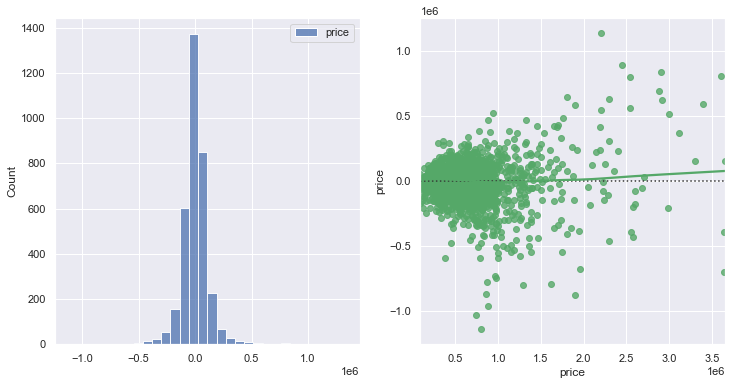

In [39]:
#Calculate residuals
residuals = (y_test - test_pred)

#Plot to check Linear Regression assumptions
fig, (ax1, ax2) = plt.subplots(1,2)
sns.set(rc={'figure.figsize':(6, 6)})
sns.histplot(residuals, bins = 30, ax = ax1)
sns.residplot(y_test, residuals, lowess=True, color="g", ax = ax2)

The residuals do retain a normal distribution. However, there is also quite a bit of heteroskedasticity.

As a result, I also tested a model that took the log of my target variable.

Below is the distribution for price:

<AxesSubplot:xlabel='price', ylabel='Count'>

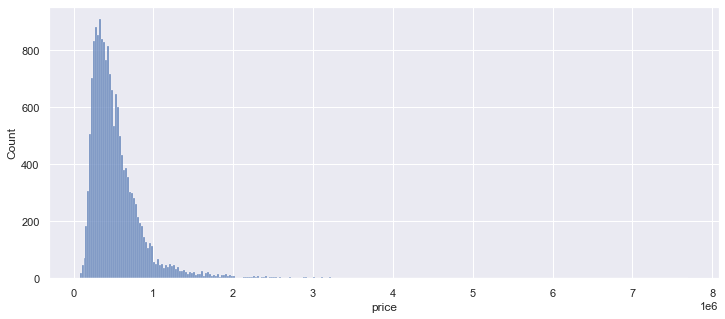

In [20]:
sns.set(rc={'figure.figsize':(12, 5)})
sns.histplot(df['price'])

<p>
<p>The graph shows a clear skew in the data. As such, I take the log to determine if it creates a gaussian distribution.
<p>

<AxesSubplot:xlabel='price', ylabel='Count'>

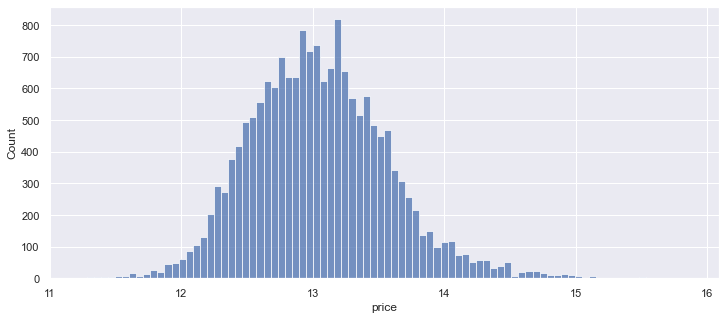

In [21]:
sns.set(rc={'figure.figsize':(12, 5)})
sns.histplot(np.log(df['price']))

Compared to the first graph, taking the log of price creates a significantly greater normal distribution when compared to price alone. As such, I train my model on the log of price to see if it results in better predictions.

In [35]:
#--- Identical process, but trained to the log of y_train ---#

#Utilize KBest to find the best variables to include in the model
selector_log = SelectKBest(f_regression, k='all')
selector_log.fit(X_train, np.log(y_train))

#Assign a list of returned columns to a variable
selected_columns_log = X_train.columns[selector_log.get_support()]

#Utilize RFECV to select the best variables to utilize from those selected by KBest
selector_RFECV_log = RFECV(estimator=LinearRegression(), step=1, cv=7, scoring='neg_mean_squared_error', n_jobs=-1, verbose=1)
selector_RFECV_log.fit(X_train[selected_columns_log], np.log(y_train))

#Assign a list of the return columns to a variable
selected_rfe_log = X_train[selected_columns_log].columns[selector_RFECV_log.support_]

#Initialize a Linear Regression model that utilizes the RFECV's selected columns
lr_log = linear_model.LinearRegression()
lr_log.fit(X_train[selected_rfe_log], np.log(y_train))
test_pred_log = lr_log.predict(X_test[selected_rfe_log])
train_pred_log = lr_log.predict(X_train[selected_rfe_log])

#Retrieve the RMSE of the training/testing predictions
res_train_log = np.sqrt(mean_squared_error(y_train, np.exp(train_pred_log)))
res_test_log =  np.sqrt(mean_squared_error(y_test, np.exp(test_pred_log)))
#Create a percent error between the training and testing RMSE
percent_error_log = round(abs((res_train_log - res_test_log)/((res_train_log + res_test_log)/2)) *100, 2)

print(f'Training RMSE:\nLog = {res_train_log}\nOriginal = {res_train}.')
print(f'\nTest RMSE:\nLog = {res_test_log}\nOriginal =  {res_test}.')
print(f'\nPercent Error:\nLog = {percent_error_log}\nOriginal = {percent_error}.')

Training RMSE:
Log = 146725.15780278092
Original = 140121.82901049175.

Test RMSE:
Log = 136459.43157684722
Original =  134526.5124724562.

Percent Error:
Log = 7.25
Original = 4.07.


Despite taking the log of the target variable, both the RMSE as well as the variance between the training/testing sets increases. As a result, I make the decision to retain the original model to save and export for predictions

___

# <center> Saving the Model </center>

___

Having completed my model, I now prepare to export it via pickle to allow me to make predictions on the second dataset.

In [12]:
lm_final = LinearRegression()

#Fit the Linear Regression model to the entirety of the testing set
lm_final = lm_final.fit(df_clean[selected_rfe], df['price'])

In [13]:
import pickle

#Export the model into a file for import into the second notebook
pickle_out = open("model.pickle","wb")
pickle.dump(lm_final, pickle_out)
pickle_out.close()

I will also export the list of columns that the RFECV chose.

In [14]:
pickle_out = open('other_info.pickle', "wb")
pickle.dump(selected_rfe, pickle_out)
pickle_out.close()